In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/47/02_0002_1_21_1016_0727_47.png
/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/47/02_0002_1_22_1016_0949_47.png
/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/47/02_0002_1_14_1016_1779_47.png
/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/47/02_0002_1_19_1016_0757_47.png
/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/47/02_0002_0_09_1016_1654_47.png
/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/47/02_0002_1_21_1016_1765_47.png
/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/47/02_0002_1_20_1016_0842_47.png
/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/47/02_0002_0_24_1016_1454_47.png
/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/47/02_0002_0_19_1016_1401_47.png
/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/47/01_0001_0_17_0916_02

In [1]:
# =========================================================
# CELL 1 : IMPORT LIBRARIES
# =========================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers, models, regularizers

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.callbacks import (
    EarlyStopping,
    ModelCheckpoint,
    ReduceLROnPlateau
)

2026-05-13 01:50:46.145009: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1778637046.383164      57 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1778637046.448407      57 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1778637047.005784      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778637047.005826      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778637047.005829      57 computation_placer.cc:177] computation placer alr

In [2]:
# =========================================================
# CELL 2 : CHECK GPU
# =========================================================

print("TensorFlow Version :", tf.__version__)

gpus = tf.config.list_physical_devices('GPU')

if gpus:
    print("GPU FOUND")
    print(gpus)
else:
    print("GPU NOT FOUND")

TensorFlow Version : 2.19.0
GPU FOUND
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [3]:
# =========================================================
# CELL 3 : DATASET PATH
# =========================================================

train_path = "/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Train/Train"

test_path = "/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test"

print("Train Path :", train_path)
print("Test Path  :", test_path)

Train Path : /kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Train/Train
Test Path  : /kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test


In [4]:
# =========================================================
# CELL 4 : IMAGE SETTINGS
# =========================================================

IMG_HEIGHT = 32
IMG_WIDTH  = 32

IMG_SHAPE = (32, 32, 1)

BATCH_SIZE = 128

EPOCHS = 30

LEARNING_RATE = 1e-3

In [5]:
# =========================================================
# CELL 5 : DATA AUGMENTATION
# =========================================================

train_datagen = ImageDataGenerator(

    # Normalize
    rescale=1./255,

    # Validation Split
    validation_split=0.2,

    # Augmentation
    rotation_range=10,
    width_shift_range=0.10,
    height_shift_range=0.10,
    zoom_range=0.10,
    shear_range=0.10,

    fill_mode='nearest'
)

# TEST DATA (NO AUGMENTATION)

test_datagen = ImageDataGenerator(
    rescale=1./255
)

In [6]:
# =========================================================
# CELL 6 : TRAIN GENERATOR
# =========================================================

train_generator = train_datagen.flow_from_directory(

    train_path,

    target_size=(IMG_HEIGHT, IMG_WIDTH),

    batch_size=BATCH_SIZE,

    color_mode='grayscale',

    class_mode='categorical',

    subset='training',

    shuffle=True
)

Found 106316 images belonging to 84 classes.


In [7]:
# =========================================================
# CELL 7 : VALIDATION GENERATOR
# =========================================================

validation_generator = train_datagen.flow_from_directory(

    train_path,

    target_size=(IMG_HEIGHT, IMG_WIDTH),

    batch_size=BATCH_SIZE,

    color_mode='grayscale',

    class_mode='categorical',

    subset='validation',

    shuffle=True
)

Found 26537 images belonging to 84 classes.


In [8]:
# =========================================================
# CELL 8 : TEST GENERATOR
# =========================================================

test_generator = test_datagen.flow_from_directory(

    test_path,

    target_size=(IMG_HEIGHT, IMG_WIDTH),

    batch_size=BATCH_SIZE,

    color_mode='grayscale',

    class_mode='categorical',

    shuffle=False
)

Found 33252 images belonging to 84 classes.


In [9]:
# =========================================================
# CELL 9 : NUMBER OF CLASSES
# =========================================================

NUM_CLASSES = len(train_generator.class_indices)

print("Total Classes :", NUM_CLASSES)

Total Classes : 84


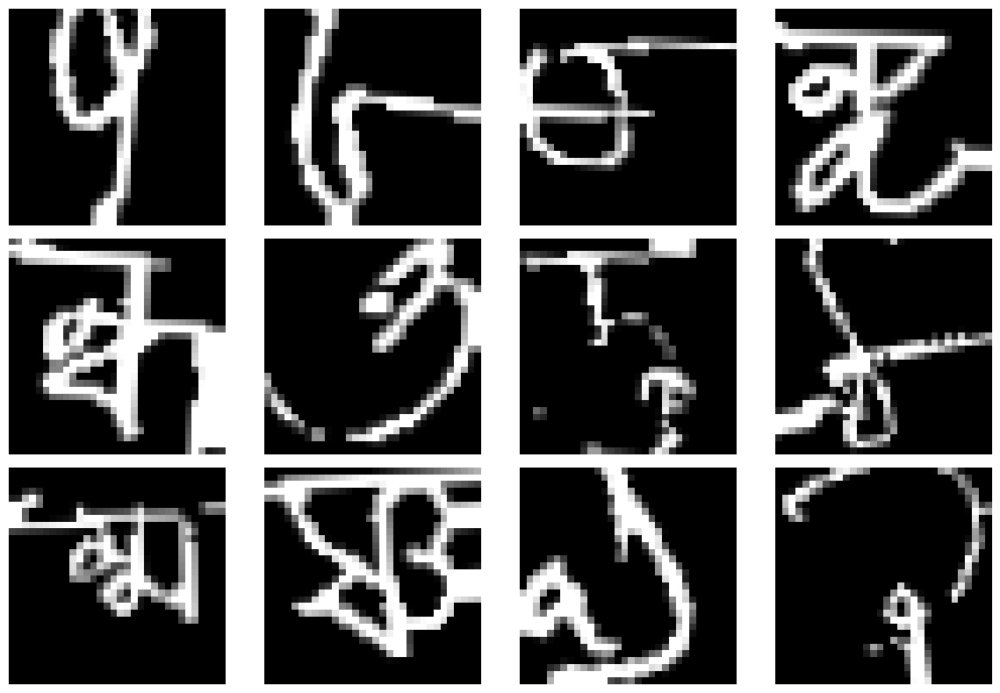

In [10]:
# =========================================================
# CELL 10 : SHOW SAMPLE IMAGES
# =========================================================

images, labels = next(train_generator)

plt.figure(figsize=(12,8))

for i in range(12):

    plt.subplot(3,4,i+1)

    plt.imshow(images[i].squeeze(), cmap='gray')

    plt.axis('off')

plt.tight_layout()

plt.show()

In [11]:
# =========================================================
# CELL 11 : BUILD CNN MODEL
# =========================================================

def build_bangla_cnn(input_shape, num_classes, learning_rate=1e-3):

    model = models.Sequential(name='BanglaLekha_CNN')

    # =====================================================
    # BLOCK 1
    # =====================================================

    model.add(layers.Input(shape=input_shape))

    model.add(layers.Conv2D(32, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(32, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Dropout(0.25))

    # =====================================================
    # BLOCK 2
    # =====================================================

    model.add(layers.Conv2D(64, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(64, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Dropout(0.25))

    # =====================================================
    # BLOCK 3
    # =====================================================

    model.add(layers.Conv2D(128, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.Conv2D(128, (3,3), padding='same'))
    model.add(layers.BatchNormalization())
    model.add(layers.Activation('relu'))

    model.add(layers.MaxPooling2D((2,2)))

    model.add(layers.Dropout(0.40))

    # =====================================================
    # CLASSIFIER HEAD
    # =====================================================

    model.add(layers.Flatten())

    model.add(
        layers.Dense(
            512,
            kernel_regularizer=regularizers.l2(1e-4)
        )
    )

    model.add(layers.BatchNormalization())

    model.add(layers.Activation('relu'))

    model.add(layers.Dropout(0.50))

    model.add(
        layers.Dense(
            256,
            kernel_regularizer=regularizers.l2(1e-4)
        )
    )

    model.add(layers.BatchNormalization())

    model.add(layers.Activation('relu'))

    model.add(layers.Dropout(0.40))

    # OUTPUT LAYER

    model.add(
        layers.Dense(
            num_classes,
            activation='softmax',
            name='output'
        )
    )

    # =====================================================
    # COMPILE MODEL
    # =====================================================

    model.compile(

        optimizer=keras.optimizers.Adam(
            learning_rate=learning_rate
        ),

        loss='categorical_crossentropy',

        metrics=[
            'accuracy',
            keras.metrics.TopKCategoricalAccuracy(
                k=5,
                name='top5_acc'
            )
        ]
    )

    return model

In [12]:
# =========================================================
# CELL 12 : CREATE MODEL
# =========================================================

model = build_bangla_cnn(
    IMG_SHAPE,
    NUM_CLASSES,
    LEARNING_RATE
)

model.summary()

I0000 00:00:1778637312.494745      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1778637312.500759      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "BanglaLekha_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 32, 32, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 32, 32, 32)     │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 32, 32, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 16, 16, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 16, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16, 16, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 8, 8, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 8, 8, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 8, 8, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 8, 8, 128)      │             

 Total params: 1,493,300 (5.70 MB)

 Trainable params: 1,490,868 (5.69 MB)

 Non-trainable params: 2,432 (9.50 KB)

In [13]:
# =========================================================
# CELL 13 : CALLBACKS
# =========================================================

early_stop = EarlyStopping(

    monitor='val_loss',

    patience=5,

    restore_best_weights=True,

    verbose=1
)

checkpoint = ModelCheckpoint(

    "bangla_cnn_best.keras",

    monitor='val_accuracy',

    save_best_only=True,

    verbose=1
)

reduce_lr = ReduceLROnPlateau(

    monitor='val_loss',

    factor=0.5,

    patience=2,

    verbose=1
)

In [14]:
# =========================================================
# CELL 14 : TRAIN MODEL
# =========================================================

history = model.fit(

    train_generator,

    validation_data=validation_generator,

    epochs=EPOCHS,

    callbacks=[
        early_stop,
        checkpoint,
        reduce_lr
    ]
)

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30


I0000 00:00:1778637326.050271     152 service.cc:152] XLA service 0x7c02240089a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1778637326.050325     152 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1778637326.050331     152 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1778637327.088060     152 cuda_dnn.cc:529] Loaded cuDNN version 91002


  1/831 ━━━━━━━━━━━━━━━━━━━━ 3:29:22 15s/step - accuracy: 0.0078 - loss: 5.1585 - top5_acc: 0.0469

I0000 00:00:1778637335.786872     152 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


831/831 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step - accuracy: 0.2051 - loss: 3.4977 - top5_acc: 0.4400
Epoch 1: val_accuracy improved from -inf to 0.71628, saving model to bangla_cnn_best.keras
831/831 ━━━━━━━━━━━━━━━━━━━━ 489s 571ms/step - accuracy: 0.2053 - loss: 3.4966 - top5_acc: 0.4402 - val_accuracy: 0.7163 - val_loss: 1.0730 - val_top5_acc: 0.9465 - learning_rate: 0.0010
Epoch 2/30
831/831 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.6661 - loss: 1.3373 - top5_acc: 0.9119
Epoch 2: val_accuracy improved from 0.71628 to 0.87139, saving model to bangla_cnn_best.keras
831/831 ━━━━━━━━━━━━━━━━━━━━ 216s 259ms/step - accuracy: 0.6661 - loss: 1.3372 - top5_acc: 0.9120 - val_accuracy: 0.8714 - val_loss: 0.5968 - val_top5_acc: 0.9842 - learning_rate: 0.0010
Epoch 3/30
831/831 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.7530 - loss: 1.0403 - top5_acc: 0.9436
Epoch 3: val_accuracy improved from 0.87139 to 0.89814, saving model to bangla_cnn_best.keras
831/831 ━━━━━━━━━━━━━━━━━━━━ 167s 201

In [15]:
# =========================================================
# CELL 15 : EVALUATE MODEL
# =========================================================

test_loss, test_acc, test_top5 = model.evaluate(test_generator)

print("Test Loss      :", test_loss)

print("Test Accuracy  :", test_acc)

print("Top5 Accuracy  :", test_top5)

260/260 ━━━━━━━━━━━━━━━━━━━━ 185s 715ms/step - accuracy: 0.9465 - loss: 0.3029 - top5_acc: 0.9918
Test Loss      : 0.32998836040496826
Test Accuracy  : 0.9375676512718201
Top5 Accuracy  : 0.9903464317321777


In [16]:
# =========================================================
# CELL 16 : SAVE FINAL MODEL
# =========================================================

model.save("final_bangla_cnn_model.keras")

print("MODEL SAVED SUCCESSFULLY")

MODEL SAVED SUCCESSFULLY


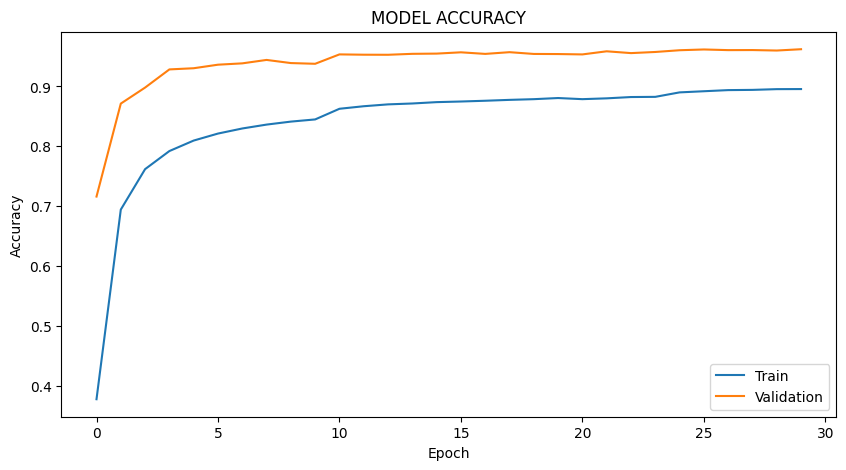

In [17]:
# =========================================================
# CELL 17 : ACCURACY GRAPH
# =========================================================

plt.figure(figsize=(10,5))

plt.plot(history.history['accuracy'])

plt.plot(history.history['val_accuracy'])

plt.title("MODEL ACCURACY")

plt.ylabel("Accuracy")

plt.xlabel("Epoch")

plt.legend(['Train', 'Validation'])

plt.show()

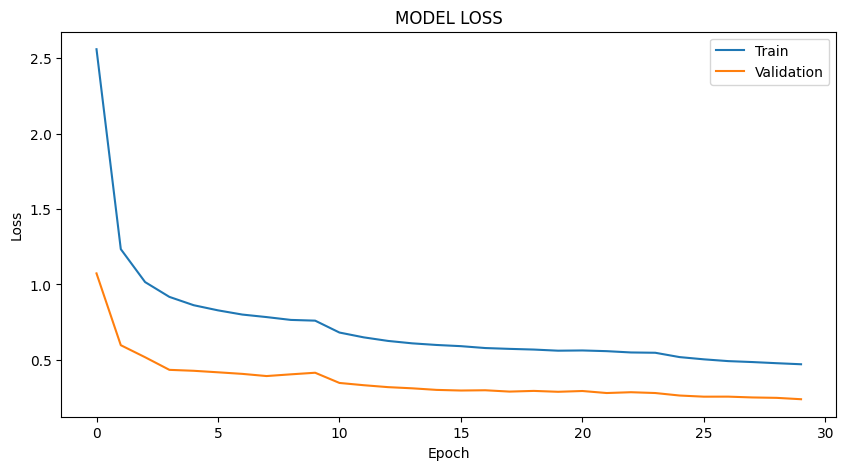

In [18]:
# =========================================================
# CELL 18 : LOSS GRAPH
# =========================================================

plt.figure(figsize=(10,5))

plt.plot(history.history['loss'])

plt.plot(history.history['val_loss'])

plt.title("MODEL LOSS")

plt.ylabel("Loss")

plt.xlabel("Epoch")

plt.legend(['Train', 'Validation'])

plt.show()

260/260 ━━━━━━━━━━━━━━━━━━━━ 65s 245ms/step


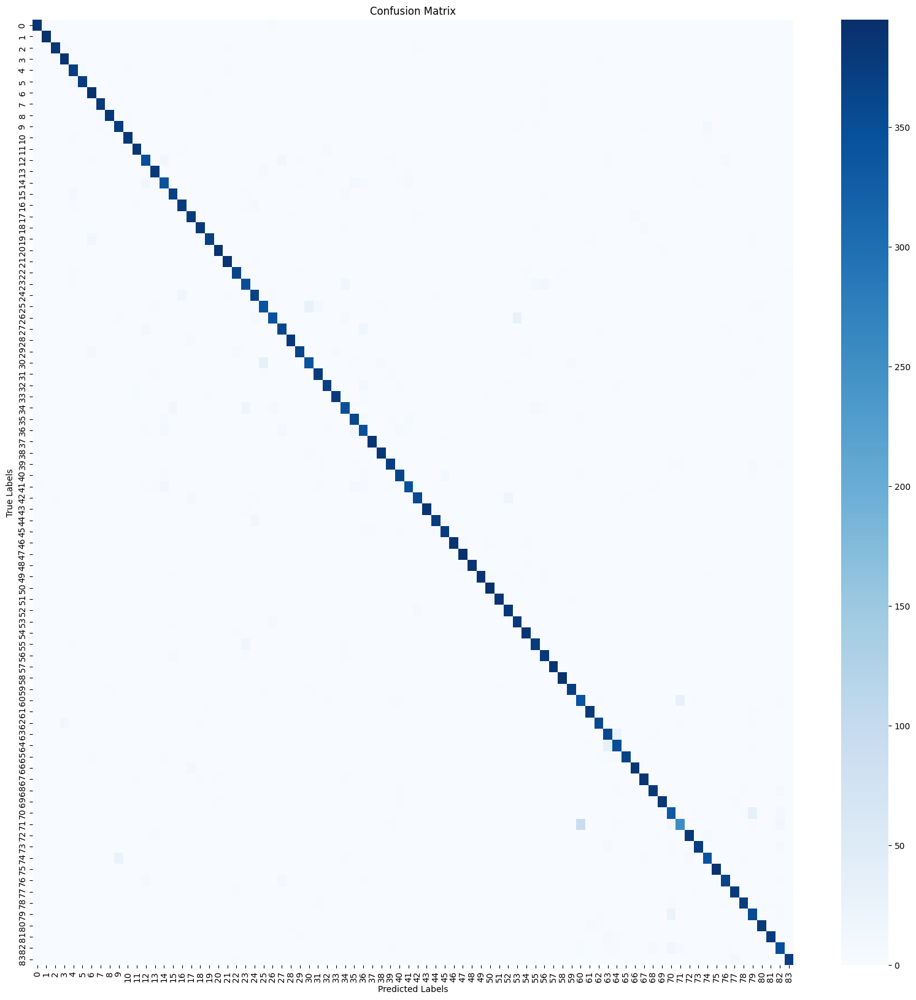

In [19]:
# =========================================================
# CELL 19 : CONFUSION MATRIX
# =========================================================

from sklearn.metrics import confusion_matrix
import seaborn as sns

# GET TRUE LABELS

true_labels = test_generator.classes

# PREDICT

predictions = model.predict(test_generator)

# GET PREDICTED LABELS

predicted_labels = np.argmax(predictions, axis=1)

# CONFUSION MATRIX

cm = confusion_matrix(true_labels, predicted_labels)

# PLOT

plt.figure(figsize=(20,20))

sns.heatmap(
    cm,
    cmap='Blues',
    annot=False,
    fmt='d'
)

plt.title("Confusion Matrix")

plt.xlabel("Predicted Labels")

plt.ylabel("True Labels")

plt.show()

In [23]:
model = tf.keras.models.load_model(
    '/kaggle/working/final_bangla_cnn_model.keras'
)

print("Model Loaded Successfully")

Model Loaded Successfully


In [24]:
Final_predict = {
    0:'অ',1:'আ',2:'ই',3:'ঈ',4:'উ',5:'ঊ',6:'ঋ',7:'এ',
    8:'ঐ',9:'ও',10:'ঔ',11:'ক',12:'খ',13:'গ',14:'ঘ',
    15:'ঙ',16:'চ',17:'ছ',18:'জ',19:'ঝ',20:'ঞ',21:'ট',
    22:'ঠ',23:'ড',24:'ঢ',25:'ণ',26:'ত',27:'থ',28:'দ',
    29:'ধ',30:'ন',31:'প',32:'ফ',33:'ব',34:'ভ',35:'ম',
    36:'য',37:'র',38:'ল',39:'শ',40:'ষ',41:'স',42:'হ',
    43:'ড়',44:'ঢ়',45:'য়',46:'ৎ',47:'ং',48:'ঃ',49:'ঁ',
    50:'০',51:'১',52:'২',53:'৩',54:'৪',55:'৫',56:'৬',
    57:'৭',58:'৮',59:'৯',60:'ক্ষ',61:'ব্দ',62:'ঙ্গ',
    63:'স্ক',64:'স্ফ',65:'স্থ',66:'চ্ছ',67:'ক্ত',68:'স্ন',
    69:'ষ্ণ',70:'ম্প',71:'ক্ষ',72:'প্ত',73:'ম্ব',74:'ন্ড',
    75:'দ্ভ',76:'ত্থ',77:'ষ্ঠ',78:'ল্প',79:'ষ্প',
    80:'ন্দ',81:'ন্ধ',82:'ম্ম',83:'ন্ঠ'
}

print("Labels Loaded")

Labels Loaded


In [33]:
import os

print(os.listdir('/kaggle/input'))

['datasets']


In [35]:
import os

print(os.listdir('/kaggle/input/datasets'))

['babumiddya01']


In [37]:
print(os.listdir('/kaggle/input/datasets/babumiddya01'))

['the-datase-11-05-2026']


In [48]:
folder_path = "/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/54"

files = os.listdir(folder_path)

print(files[:20])

['01_0001_1_17_0916_1952_54.png', '01_0001_1_14_0916_0418_54.png', '02_0002_1_21_1016_1805_54.png', '01_0001_1_17_0916_0064_54.png', '01_0001_0_14_0916_0204_54.png', '01_0001_1_16_0916_0516_54.png', '01_0001_1_14_0916_0089_54.png', '02_0002_1_20_1016_1140_54.png', '02_0002_1_21_1016_0629_54.png', '02_0002_0_18_1016_1078_54.png', '02_0002_0_23_1016_1800_54.png', '02_0002_1_21_1016_1321_54.png', '02_0002_0_19_1016_1325_54.png', '02_0002_0_14_1016_1674_54.png', '02_0002_0_21_1016_0996_54.png', '02_0002_0_20_1016_1201_54.png', '01_0001_0_15_0916_0430_54.png', '01_0001_0_16_0916_0095_54.png', '02_0002_0_24_1016_0692_54.png', '02_0002_1_20_1016_1666_54.png']


In [52]:
img_path = os.path.join(folder_path, files[19])

print(img_path)

/kaggle/input/datasets/babumiddya01/the-datase-11-05-2026/Test/Test/54/02_0002_1_20_1016_1666_54.png


(104, 104)


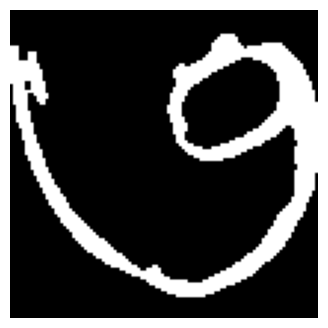

In [53]:
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

print(img.shape)

plt.figure(figsize=(4,4))
plt.imshow(img, cmap='gray')
plt.axis('off')
plt.show()

In [54]:
img = cv2.resize(img, (32, 32))

img = img / 255.0

img_input = img.reshape(1, 32, 32, 1)

prediction = model.predict(img_input)

predicted_class = np.argmax(prediction)

confidence = np.max(prediction) * 100

predicted_character = Final_predict[predicted_class]

print("Predicted Class :", predicted_class)
print("Predicted Character :", predicted_character)
print("Confidence :", round(confidence, 2), "%")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
Predicted Class : 53
Predicted Character : ৩
Confidence : 88.52 %
